In [6]:
import pyodbc
import pandas as pd
import numpy as np
import time 
from kmodes.kmodes import KModes
from kmodes.kprototypes import KPrototypes

from sklearn import metrics
import sqlalchemy
import constants

import helper_functions
import config


In [15]:
labelsDF

,RetailPrice,Gender,ProductCategory,ProductSubcategory,Length,Sleeve,CollarDesign,NeckDesign,Fit
0,24.0,2.0,0,0,0,0,0,0,0
1,40.0,2.0,0,0,0,0,0,0,0
2,65.0,2.0,0,0,0,0,0,0,0
3,50.0,2.0,0,0,0,0,0,0,0
4,55.0,2.0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
194,0.0,0.0,0,0,0,0,0,0,0
195,0.0,0.0,0,0,0,0,0,0,0
196,0.0,0.0,0,0,0,0,0,0,0
197,0.0,0.0,0,69,0,0,0,0,0


In [7]:
if __name__ == "__main__":
    # Begin Counting Time
    start_time = time.time()    
    
    # Database settings
    engine = helper_functions.ENGINE
    dbName = helper_functions.DB_NAME
    # query = ''' SELECT * FROM %s.dbo.Product ''' % dbName
    query = '''SELECT * FROM "%s".public."Product"''' % dbName
    productDF = pd.read_sql_query(query, engine)
    
    labelsDF = productDF[config.CLUSTERING_PRODUCT_ATTRIBUTES].copy() #'Inspiration_Background'
    labelsDF.fillna(0, inplace=True)
    # Read all the tables of features from S4F DB to match id to genID
    attrDict = {}
    for attr in (config.PRODUCT_ATTRIBUTES):
        # query = ''' SELECT * FROM %s.dbo.%s ''' % (dbName, attr)
        query = '''SELECT * FROM "%s".public."%s"''' % (dbName, attr)
        attrDict[str(attr)+'DF'] = pd.read_sql_query(query, engine)
        
    # Merging tables with product to create the product with values not id.
    for attr in (config.PRODUCT_ATTRIBUTES):
        _tempDF = labelsDF.merge(attrDict[str(attr)+'DF'], how = 'left', left_on=str(attr), right_on='Oid')
        labelsDF.loc[:,str(attr)] = _tempDF.loc[:,str(attr)]
    
    ## Clustering process
    #
    # Prepare data for clustering (skip RetailPrice column)
    X = labelsDF.to_numpy()[:,1:].astype('int')
    kmodes = KModes(n_clusters=config.N_CLUSTERS, init=config.INITKMODES, verbose=2)
    clusters = kmodes.fit_predict(X)
    centroids = kmodes.cluster_centroids_
    clustering_dict = {attr:centroids[:,i] for i,attr in enumerate(labelsDF.columns[1:])}
    clustering_dict['Cluster'] = range(config.N_CLUSTERS)
    clustering_dict['RetailPrice'] = config.N_CLUSTERS * [None]
    clustering_dict['LifeStage'] = config.N_CLUSTERS * [None]
    clusteringDF = pd.DataFrame(clustering_dict)

    ## Update Cluster table
    #
    # clusteringDF.to_sql("temp_table", schema='%s.dbo' % dbName, con=engine, if_exists='replace', index=False)
    clusteringDF.to_sql("temp_table", con = engine, if_exists = 'replace', index = False)
    with engine.begin() as conn:
        conn.execute(config.UPDATE_CLUSTERS_QUERY)

    ## Update Product table
    #
    dataDF = pd.DataFrame({'Oid': productDF['Oid'], 'Cluster': clusters})
    # dataDF.to_sql("temp_table", schema='%s.dbo' % dbName, con=engine, if_exists='replace', index=False)
    dataDF.to_sql("temp_table", con = engine, if_exists = 'replace', index = False)
    with engine.begin() as conn:
        conn.execute(config.UPDATE_PRODUCT_CLUSTERS_QUERY) 
        
    # End Counting Time
    print("--- %s seconds ---" % (time.time() - start_time))

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 12, cost: 205.0
Run 1, iteration: 2/100, moves: 0, cost: 205.0
--- 1.912062168121338 seconds ---


In [10]:
import cv2

def cv_imshow(image, title=""):
    from matplotlib import pyplot as plt
    if len(np.shape(image))==2:
        plt.title(title)
        plt.imshow(image, cmap='gray')
    if len(np.shape(image))==3 and image.shape[2]==3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.title(title)
        plt.imshow(image)
    return plt.show()

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\bluescarfs\image3_2020.12.03+20.37.01.jpeg


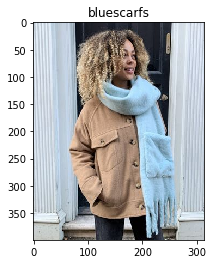

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\bluescarfs\image4_2020.12.03+20.37.02.jpeg


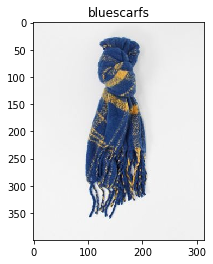

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\bluescarfs\image5_2020.12.03+20.37.06.jpeg


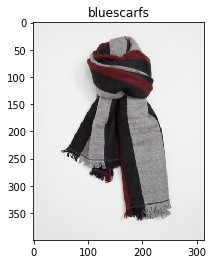

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\bluescarfs\image6_2020.12.03+20.37.07.jpeg


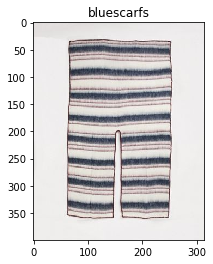

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\bluescarfs\image7_2020.12.03+20.37.08.jpeg


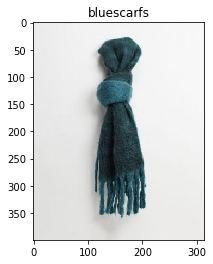

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\bluescarfs\image8_2020.12.03+20.37.09.jpeg


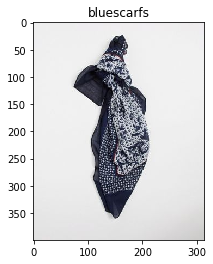

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\bluescarfs\image9_2020.12.03+20.37.10.jpeg


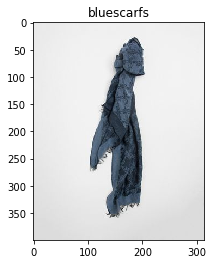

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\bluescarfs\image10_2020.12.03+20.37.12.jpeg


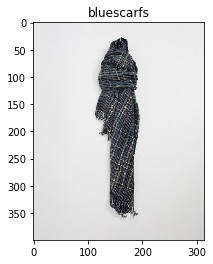

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redcardigans\image2_2020.12.03+20.37.18.jpeg


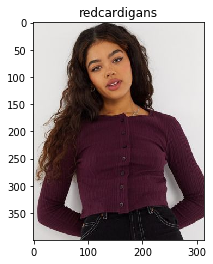

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redcardigans\image3_2020.12.03+20.37.19.jpeg


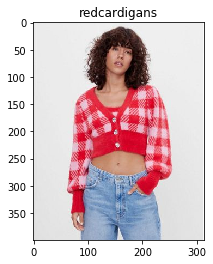

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redcardigans\image4_2020.12.03+20.37.20.jpeg


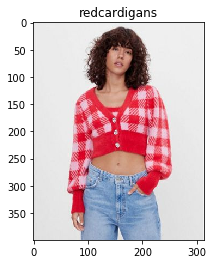

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redcardigans\image5_2020.12.03+20.37.21.jpeg


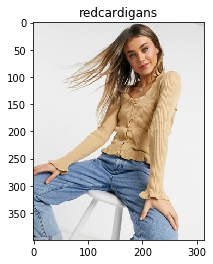

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redcardigans\image10_2020.12.03+20.37.27.jpeg


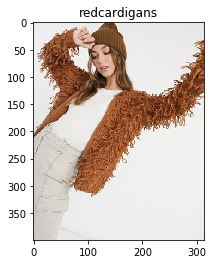

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redshirts\image8_2020.12.03+20.52.18.jpeg


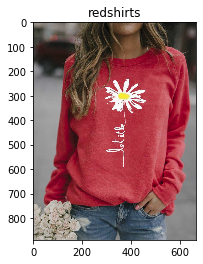

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\pinkdresses\image1_2020.12.03+20.38.02.jpeg


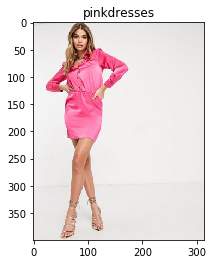

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\pinkdresses\image2_2020.12.03+20.38.03.jpeg


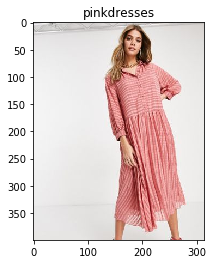

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\pinkdresses\image12_2020.12.03+20.51.53.jpeg


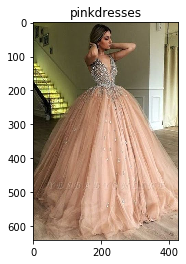

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\pinkdresses\image3_2020.12.03+20.38.04.jpeg


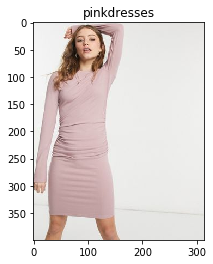

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\pinkdresses\image4_2020.12.03+20.38.05.jpeg


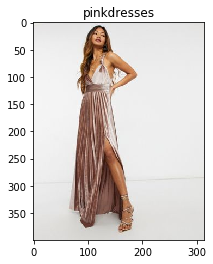

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\pinkdresses\image6_2020.12.03+20.38.08.jpeg


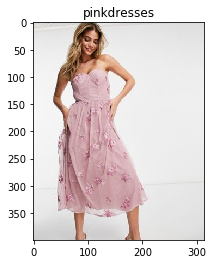

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\pinkdresses\image7_2020.12.03+20.38.09.jpeg


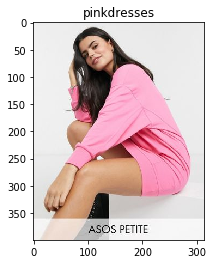

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\pinkdresses\image8_2020.12.03+20.38.10.jpeg


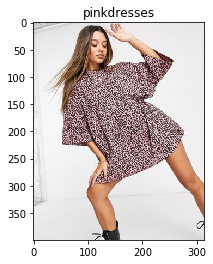

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\pinkdresses\image10_2020.12.03+20.38.13.jpeg


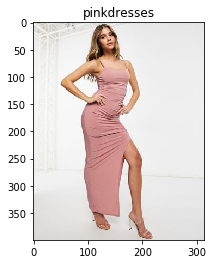

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\pinkdresses\image7_2020.12.03+20.51.53.jpeg
D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\blackjackets\image3_2020.12.03+20.38.51.jpeg


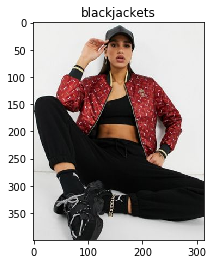

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\blackjackets\image4_2020.12.03+20.38.52.jpeg


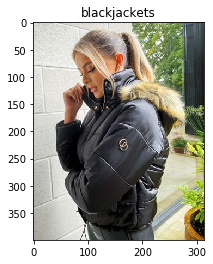

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\blackjackets\image5_2020.12.03+20.38.53.jpeg


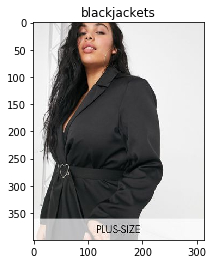

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\blackjackets\image7_2020.12.03+20.38.56.jpeg


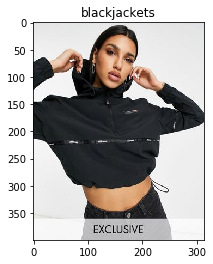

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\blackjackets\image10_2020.12.03+20.39.00.jpeg


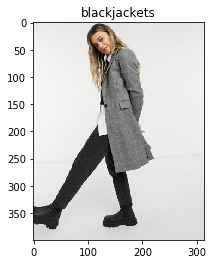

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redshirts\image10_2020.12.03+20.39.19.jpeg


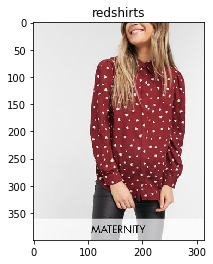

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\bluescarfs\image1_2020.12.03+20.39.48.jpeg


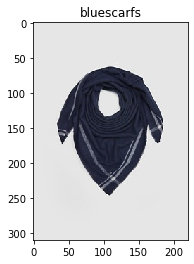

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\bluescarfs\image2_2020.12.03+20.39.52.jpeg


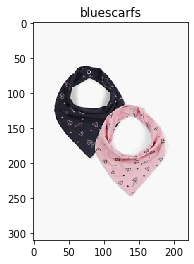

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\bluescarfs\image3_2020.12.03+20.39.54.jpeg


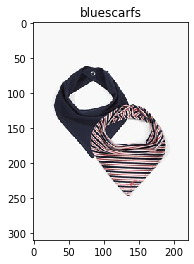

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\bluescarfs\image4_2020.12.03+20.39.57.jpeg


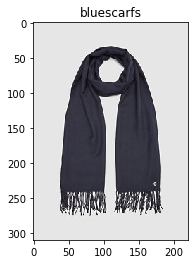

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\bluescarfs\image5_2020.12.03+20.40.00.jpeg


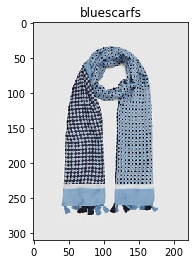

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\bluescarfs\image6_2020.12.03+20.40.06.jpeg


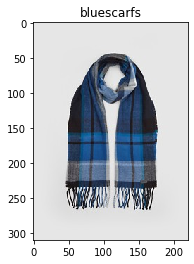

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\bluescarfs\image7_2020.12.03+20.40.09.jpeg


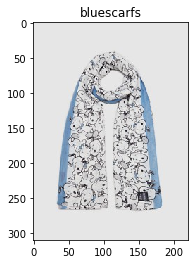

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\bluescarfs\image8_2020.12.03+20.40.11.jpeg


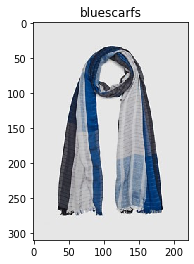

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\bluescarfs\image9_2020.12.03+20.40.14.jpeg


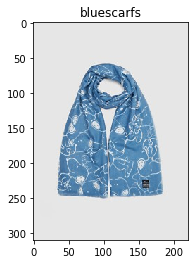

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\bluescarfs\image10_2020.12.03+20.40.18.jpeg


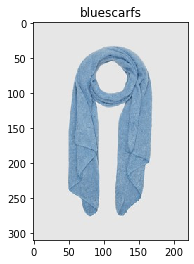

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redcardigans\image3_2020.12.03+20.41.10.jpeg


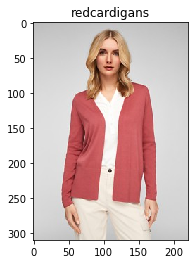

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redcardigans\image5_2020.12.03+20.41.21.jpeg


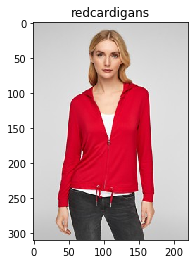

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redcardigans\image6_2020.12.03+20.41.25.jpeg


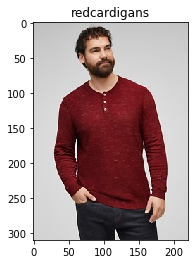

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redcardigans\image7_2020.12.03+20.41.29.jpeg


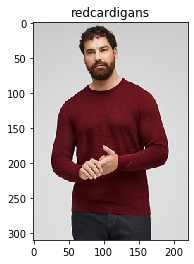

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redcardigans\image8_2020.12.03+20.41.33.jpeg


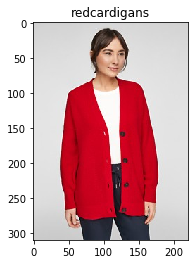

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redcardigans\image10_2020.12.03+20.41.41.jpeg


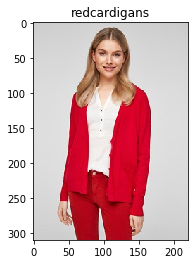

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\pinkdresses\image1_2020.12.03+20.42.17.jpeg


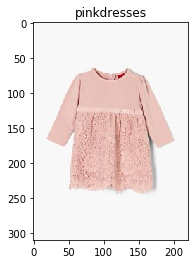

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\pinkdresses\image2_2020.12.03+20.42.21.jpeg


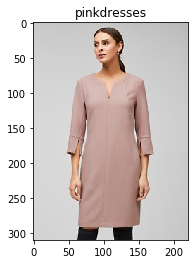

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\pinkdresses\image3_2020.12.03+20.42.25.jpeg


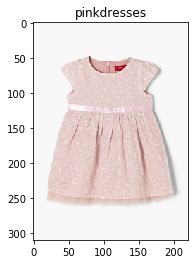

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\blackjackets\image4_2020.12.03+20.50.09.jpeg


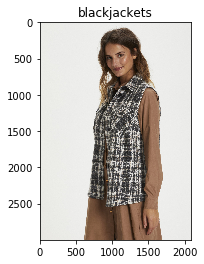

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\bluescarfs\image1_2020.12.03+20.47.29.jpeg


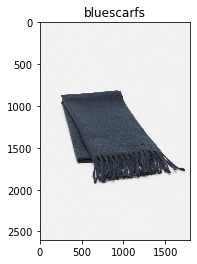

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\blackjackets\image1_2020.12.03+20.43.57.jpeg


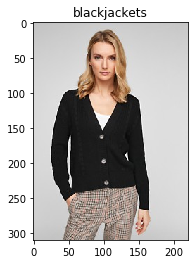

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\bluescarfs\image5_2020.12.03+20.51.28.jpeg
D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\blackjackets\image3_2020.12.03+20.44.06.jpeg


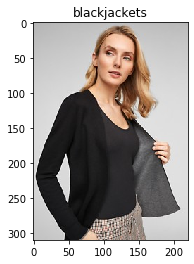

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\blackjackets\image4_2020.12.03+20.44.10.jpeg


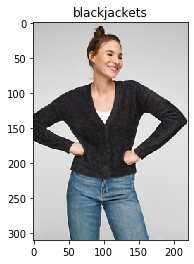

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\blackjackets\image7_2020.12.03+20.44.20.jpeg


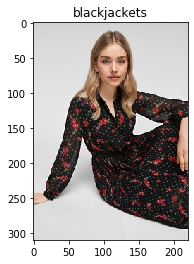

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\blackjackets\image9_2020.12.03+20.44.28.jpeg


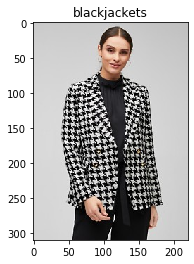

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redshirts\image1_2020.12.03+20.46.44.jpeg


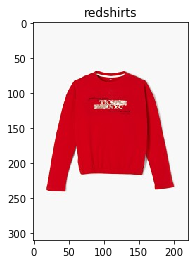

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redshirts\image5_2020.12.03+20.47.00.jpeg


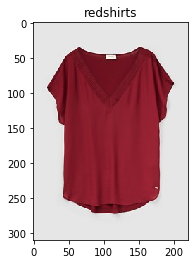

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redshirts\image6_2020.12.03+20.47.03.jpeg


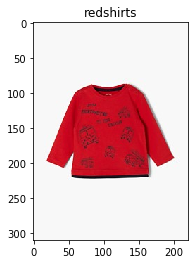

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redshirts\image7_2020.12.03+20.47.07.jpeg


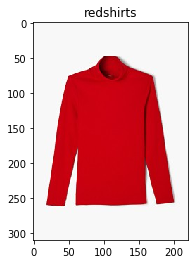

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redshirts\image8_2020.12.03+20.47.10.jpeg


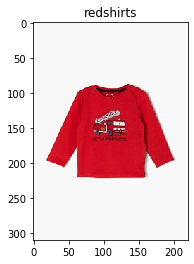

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redshirts\image9_2020.12.03+20.47.13.jpeg


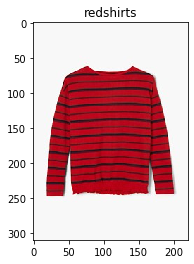

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redshirts\image10_2020.12.03+20.47.17.jpeg


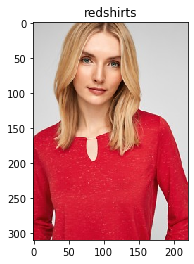

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\bluescarfs\image2_2020.12.03+20.47.32.jpeg


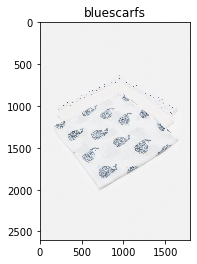

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\bluescarfs\image3_2020.12.03+20.47.33.jpeg


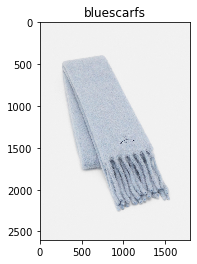

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\bluescarfs\image4_2020.12.03+20.47.35.jpeg


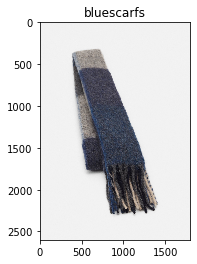

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\bluescarfs\image5_2020.12.03+20.47.37.jpeg


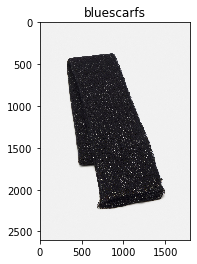

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\bluescarfs\image6_2020.12.03+20.47.39.jpeg


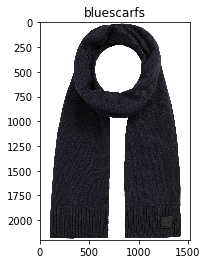

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\bluescarfs\image7_2020.12.03+20.47.41.jpeg


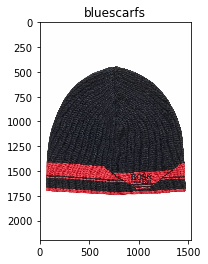

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\bluescarfs\image8_2020.12.03+20.47.43.jpeg


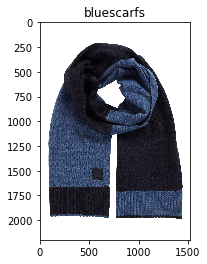

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\bluescarfs\image9_2020.12.03+20.47.44.jpeg


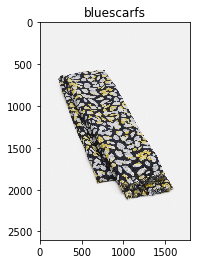

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\bluescarfs\image10_2020.12.03+20.47.46.jpeg


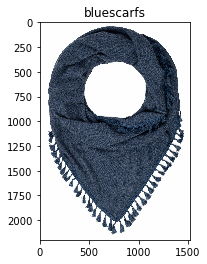

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redcardigans\image1_2020.12.03+20.47.56.jpeg


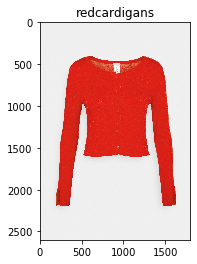

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redcardigans\image2_2020.12.03+20.47.58.jpeg


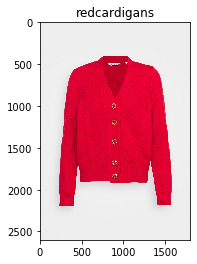

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redcardigans\image3_2020.12.03+20.48.00.jpeg


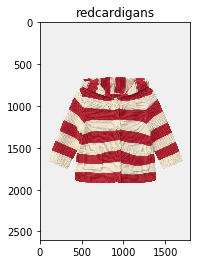

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redcardigans\image4_2020.12.03+20.48.01.jpeg


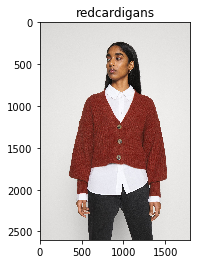

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redcardigans\image5_2020.12.03+20.48.04.jpeg


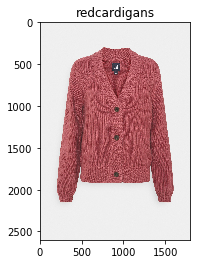

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redcardigans\image6_2020.12.03+20.48.06.jpeg


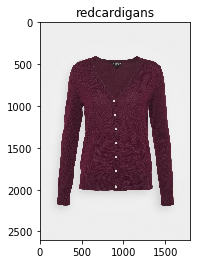

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redcardigans\image7_2020.12.03+20.48.08.jpeg


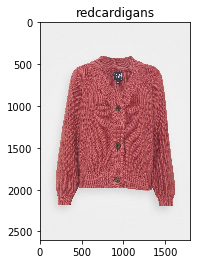

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redcardigans\image8_2020.12.03+20.48.10.jpeg


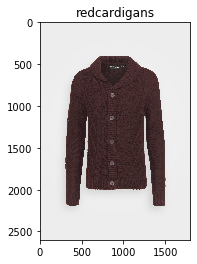

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redcardigans\image9_2020.12.03+20.48.13.jpeg


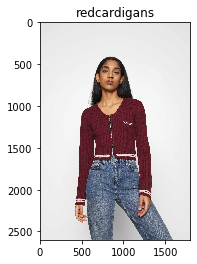

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redcardigans\image10_2020.12.03+20.48.14.jpeg


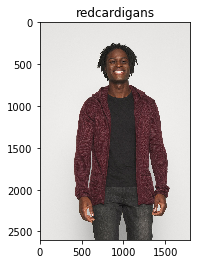

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\pinkdresses\image1_2020.12.03+20.48.45.jpeg


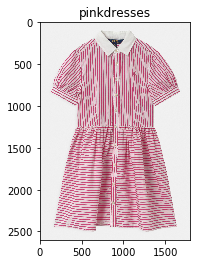

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\pinkdresses\image2_2020.12.03+20.48.48.jpeg


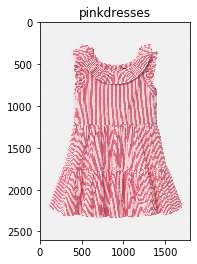

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\pinkdresses\image3_2020.12.03+20.51.53.jpeg


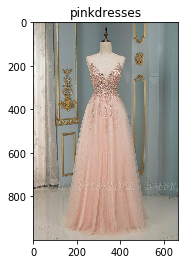

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\pinkdresses\image3_2020.12.03+20.48.50.jpeg


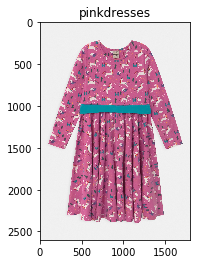

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\pinkdresses\image4_2020.12.03+20.48.52.jpeg


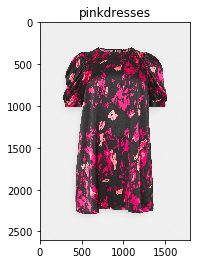

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\pinkdresses\image5_2020.12.03+20.48.55.jpeg


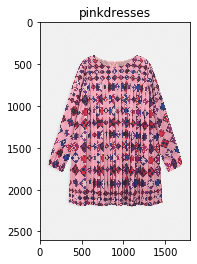

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\pinkdresses\image6_2020.12.03+20.48.56.jpeg


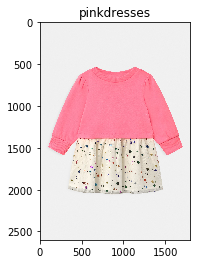

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\pinkdresses\image7_2020.12.03+20.48.58.jpeg


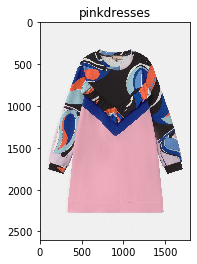

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\pinkdresses\image8_2020.12.03+20.48.59.jpeg


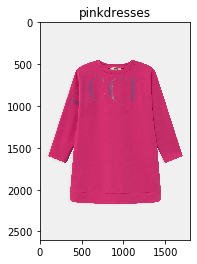

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\pinkdresses\image9_2020.12.03+20.49.01.jpeg


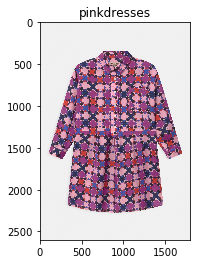

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\pinkdresses\image10_2020.12.03+20.49.03.jpeg


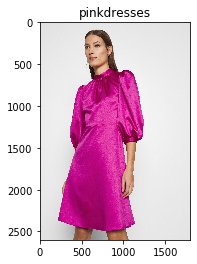

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\blackjackets\image1_2020.12.03+20.50.03.jpeg


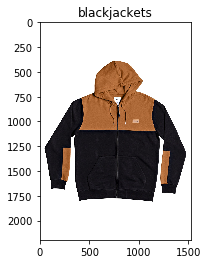

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\blackjackets\image2_2020.12.03+20.50.06.jpeg


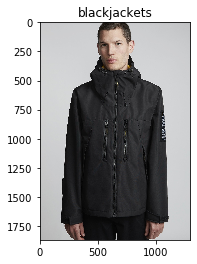

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\blackjackets\image3_2020.12.03+20.50.08.jpeg


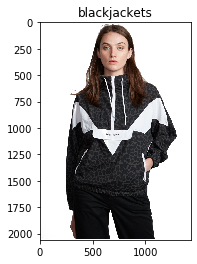

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redshirts\image4_2020.12.03+20.51.00.jpeg


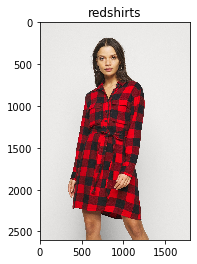

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\blackjackets\image5_2020.12.03+20.50.13.jpeg


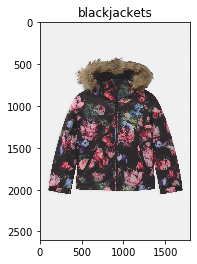

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\blackjackets\image6_2020.12.03+20.50.14.jpeg


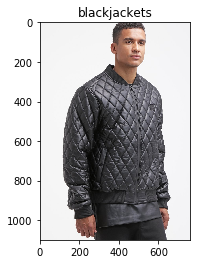

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\blackjackets\image7_2020.12.03+20.50.16.jpeg


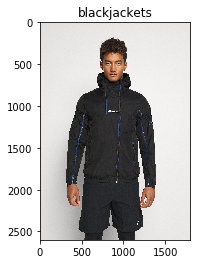

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\blackjackets\image8_2020.12.03+20.50.18.jpeg


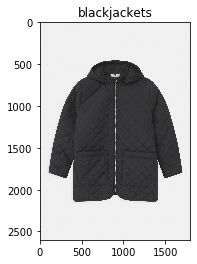

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\blackjackets\image9_2020.12.03+20.50.20.jpeg


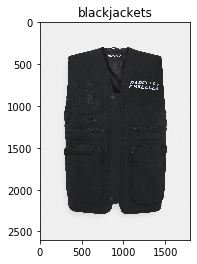

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\blackjackets\image10_2020.12.03+20.50.21.jpeg


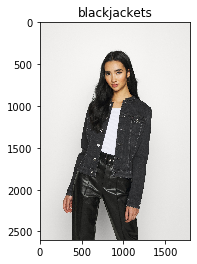

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redshirts\image1_2020.12.03+20.50.54.jpeg


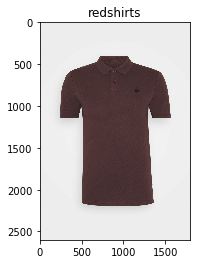

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redshirts\image2_2020.12.03+20.50.55.jpeg


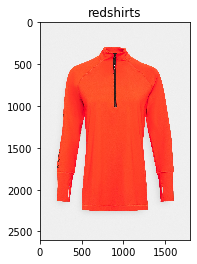

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redshirts\image3_2020.12.03+20.50.57.jpeg


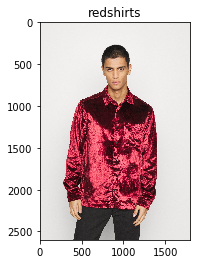

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\pinkdresses\image4_2020.12.03+20.51.53.jpeg


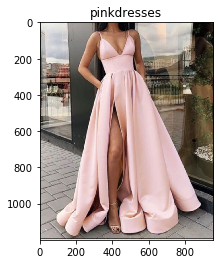

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redshirts\image5_2020.12.03+20.51.02.jpeg


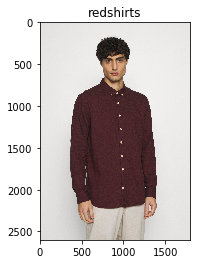

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redshirts\image6_2020.12.03+20.51.04.jpeg


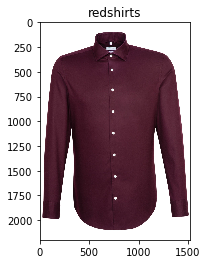

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redshirts\image8_2020.12.03+20.51.07.jpeg


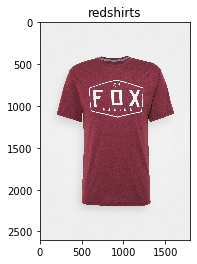

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redshirts\image9_2020.12.03+20.51.09.jpeg


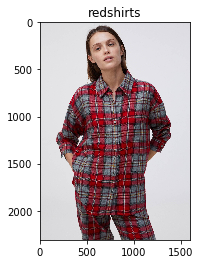

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redshirts\image10_2020.12.03+20.51.11.jpeg


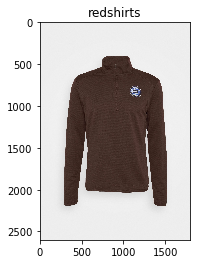

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\bluescarfs\image2_2020.12.03+20.51.28.jpeg


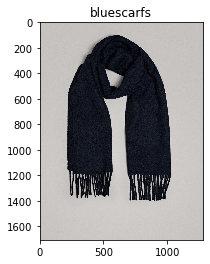

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\bluescarfs\image0_2020.12.03+20.51.28.jpeg


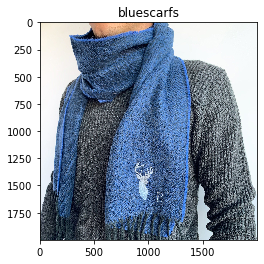

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\bluescarfs\image1_2020.12.03+20.51.28.jpeg


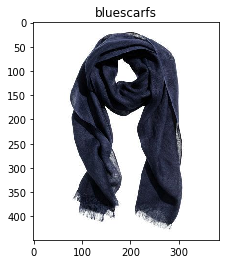

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\bluescarfs\image4_2020.12.03+20.51.28.jpeg


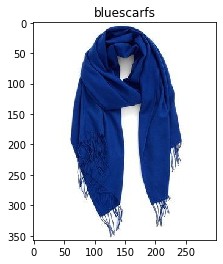

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\bluescarfs\image7_2020.12.03+20.51.28.jpeg


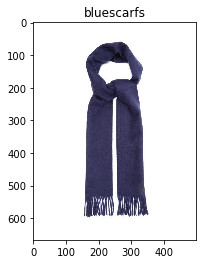

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\bluescarfs\image3_2020.12.03+20.51.28.jpeg


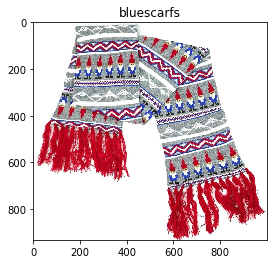

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\bluescarfs\image6_2020.12.03+20.51.28.jpeg


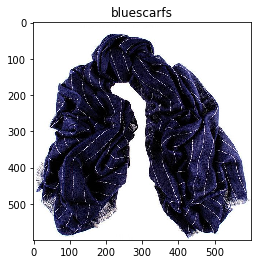

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\bluescarfs\image9_2020.12.03+20.51.28.jpeg
D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\bluescarfs\image8_2020.12.03+20.51.28.jpeg


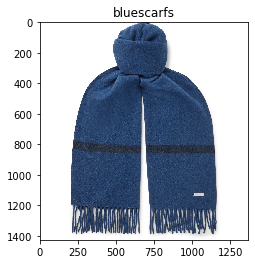

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redcardigans\image1_2020.12.03+20.51.43.jpeg


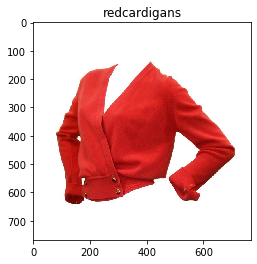

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redcardigans\image7_2020.12.03+20.51.43.jpeg


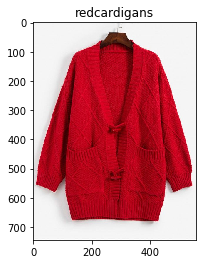

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redcardigans\image3_2020.12.03+20.51.43.jpeg


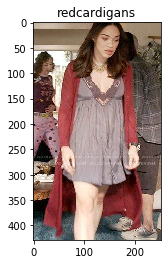

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redcardigans\image9_2020.12.03+20.51.43.jpeg


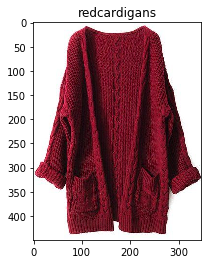

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redcardigans\image8_2020.12.03+20.51.43.jpeg


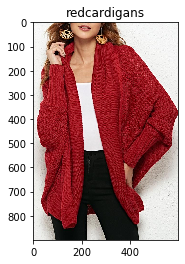

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\pinkdresses\image1_2020.12.03+20.51.53.jpeg


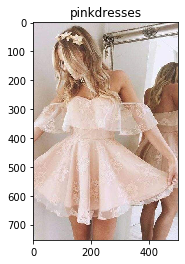

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\pinkdresses\image2_2020.12.03+20.51.53.jpeg


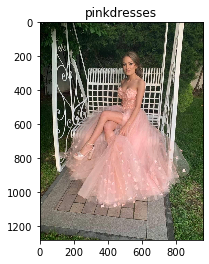

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\pinkdresses\image9_2020.12.03+20.51.53.jpeg


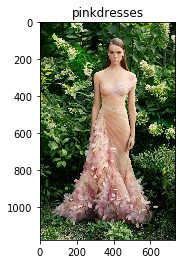

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\pinkdresses\image8_2020.12.03+20.51.53.jpeg


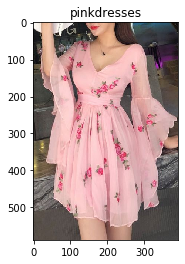

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\pinkdresses\image11_2020.12.03+20.51.53.jpeg


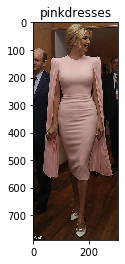

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\blackjackets\image2_2020.12.03+20.52.07.jpeg


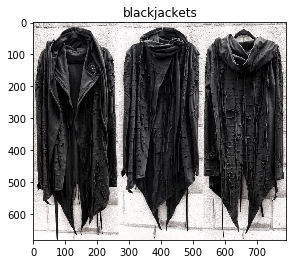

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\blackjackets\image5_2020.12.03+20.52.07.jpeg


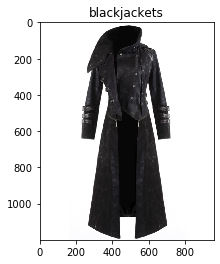

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\blackjackets\image6_2020.12.03+20.52.07.jpeg


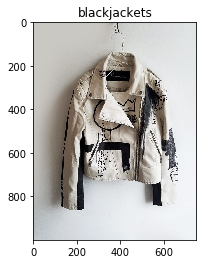

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\blackjackets\image8_2020.12.03+20.52.07.jpeg


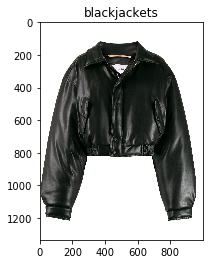

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\blackjackets\image7_2020.12.03+20.52.07.jpeg


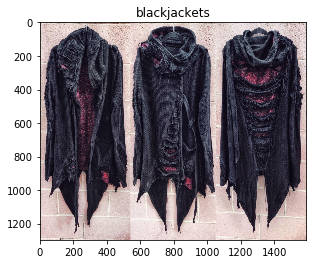

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\bluescarfs\image1_2020.12.03+20.36.59.jpeg


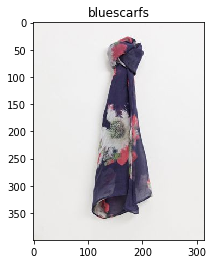

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\bluescarfs\image2_2020.12.03+20.37.00.jpeg


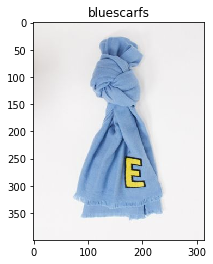

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\blackjackets\image1_2020.12.03+20.52.07.jpeg


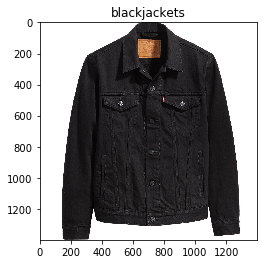

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redshirts\image5_2020.12.03+20.52.18.jpeg


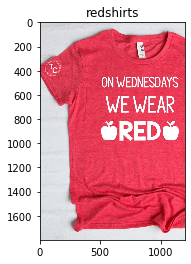

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redshirts\image7_2020.12.03+20.52.18.jpeg


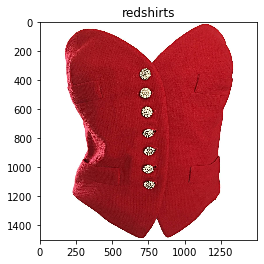

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redshirts\image6_2020.12.03+20.52.18.jpeg


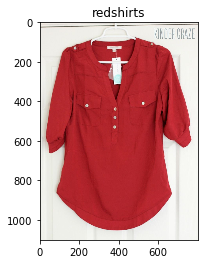


-------------------


-------------------


-------------------


-------------------


-------------------

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redshirts\image0_2020.12.03+20.52.18.jpeg


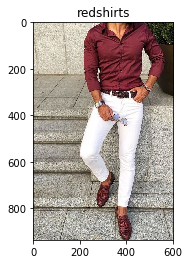

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redcardigans\image2_2020.12.03+20.51.43.jpeg


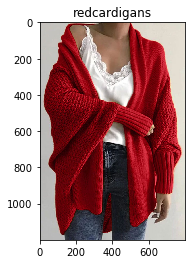

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redcardigans\image0_2020.12.03+20.51.43.jpeg


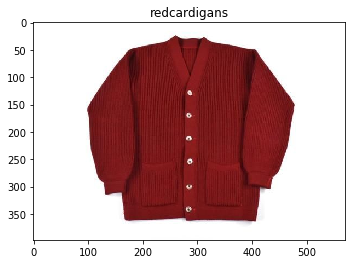

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redcardigans\image4_2020.12.03+20.51.43.jpeg


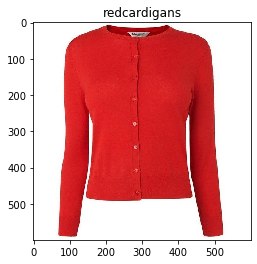

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redcardigans\image5_2020.12.03+20.51.43.jpeg


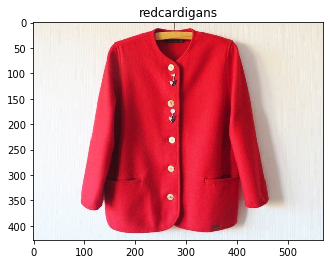

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redcardigans\image6_2020.12.03+20.51.43.jpeg


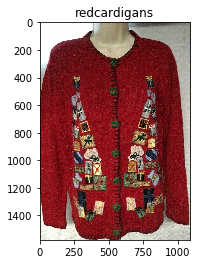

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\blackjackets\image0_2020.12.03+20.52.07.jpeg


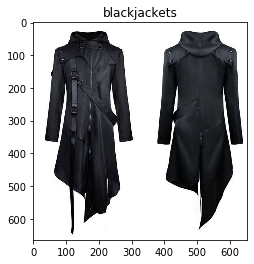

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\blackjackets\image4_2020.12.03+20.52.07.jpeg


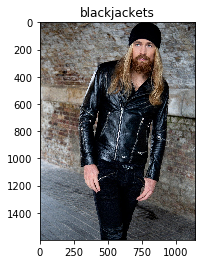

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\blackjackets\image3_2020.12.03+20.52.07.jpeg


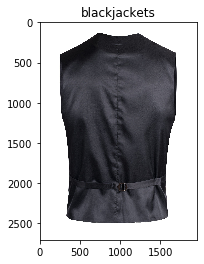

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\blackjackets\image9_2020.12.03+20.52.07.jpeg


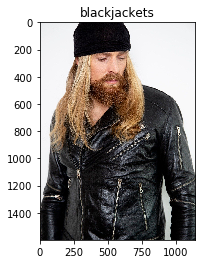

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redshirts\image1_2020.12.03+20.52.18.jpeg


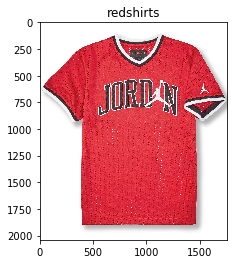

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redshirts\image4_2020.12.03+20.52.18.jpeg


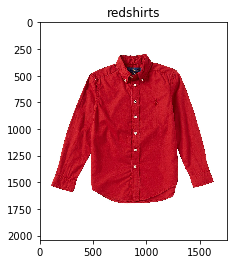

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redshirts\image3_2020.12.03+20.52.18.jpeg


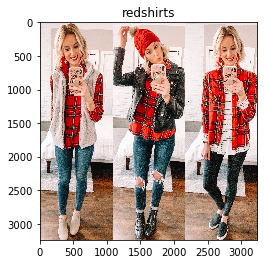

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redshirts\image2_2020.12.03+20.52.18.jpeg


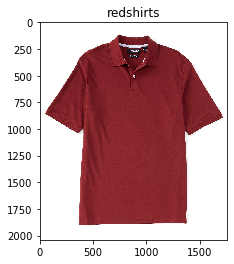

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\redshirts\image9_2020.12.03+20.52.18.jpeg


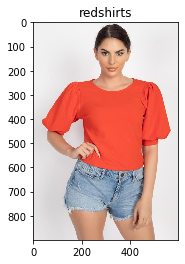


-------------------


-------------------


-------------------


-------------------


-------------------

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redcardigans\image1_2020.12.03+20.37.16.jpeg


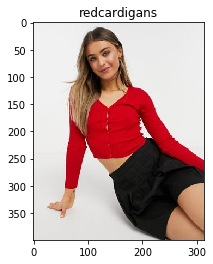

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redcardigans\image6_2020.12.03+20.37.22.jpeg


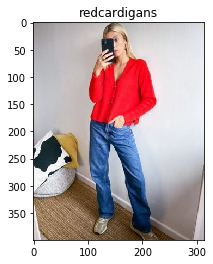

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redcardigans\image7_2020.12.03+20.37.24.jpeg


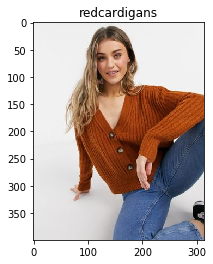

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redcardigans\image8_2020.12.03+20.37.25.jpeg


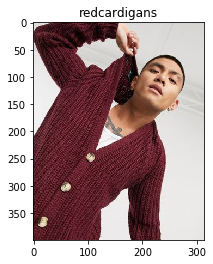

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\blackjackets\image6_2020.12.03+20.38.55.jpeg


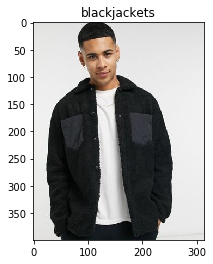

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\blackjackets\image8_2020.12.03+20.38.57.jpeg


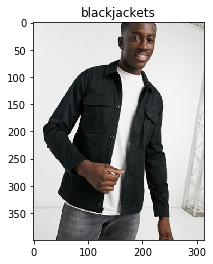

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\PinterestImages\pinkdresses\image6_2020.12.03+20.51.53.jpeg


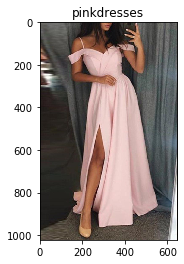


-------------------


-------------------


-------------------


-------------------


-------------------

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redcardigans\image9_2020.12.03+20.37.26.jpeg


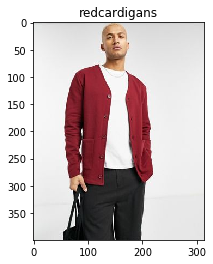

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\pinkdresses\image5_2020.12.03+20.38.07.jpeg


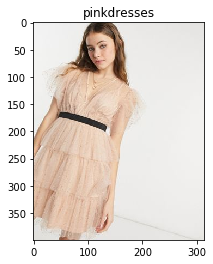

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\pinkdresses\image9_2020.12.03+20.38.12.jpeg


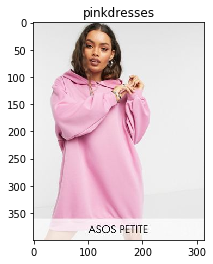

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\blackjackets\image9_2020.12.03+20.38.58.jpeg


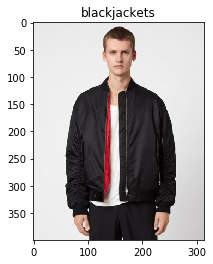

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\blackjackets\image2_2020.12.03+20.38.50.jpeg


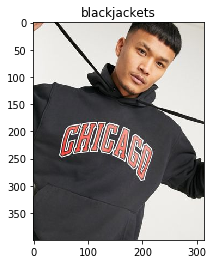

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redshirts\image1_2020.12.03+20.39.07.jpeg


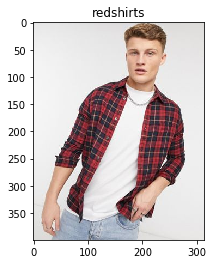

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redshirts\image2_2020.12.03+20.39.08.jpeg


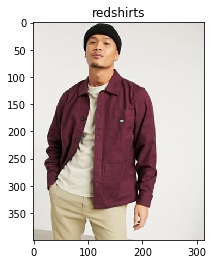

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redshirts\image3_2020.12.03+20.39.10.jpeg


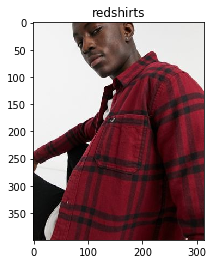

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redshirts\image4_2020.12.03+20.39.11.jpeg


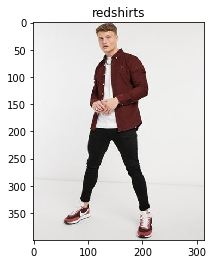

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redshirts\image5_2020.12.03+20.39.12.jpeg


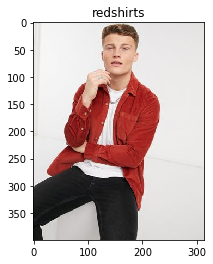

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redshirts\image6_2020.12.03+20.39.14.jpeg


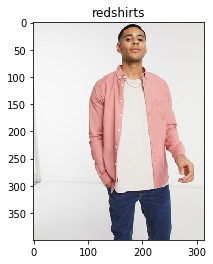

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redshirts\image8_2020.12.03+20.39.16.jpeg


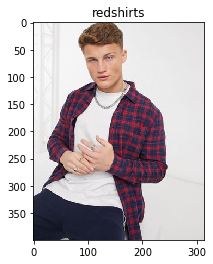

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redshirts\image9_2020.12.03+20.39.17.jpeg


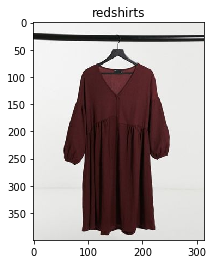

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\blackjackets\image5_2020.12.03+20.44.13.jpeg


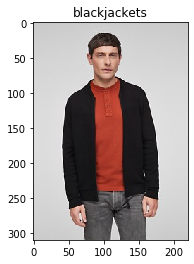

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\blackjackets\image10_2020.12.03+20.44.32.jpeg


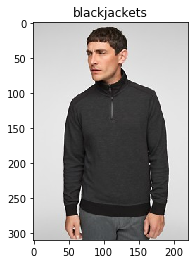

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redshirts\image3_2020.12.03+20.46.52.jpeg


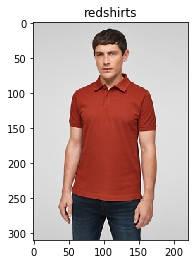

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redshirts\image4_2020.12.03+20.46.56.jpeg


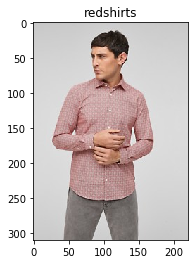


-------------------


-------------------


-------------------


-------------------


-------------------

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\blackjackets\image1_2020.12.03+20.38.48.jpeg


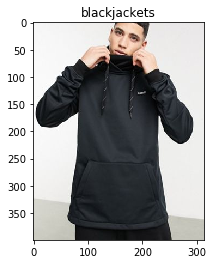

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\AsosImages\redshirts\image7_2020.12.03+20.39.15.jpeg


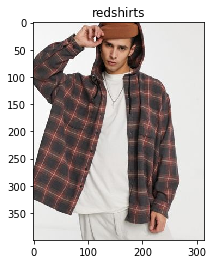

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redcardigans\image1_2020.12.03+20.41.02.jpeg


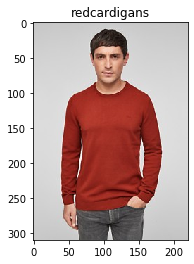

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redcardigans\image2_2020.12.03+20.41.06.jpeg


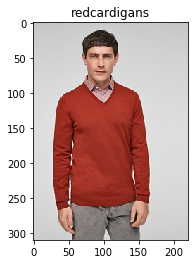

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redcardigans\image4_2020.12.03+20.41.15.jpeg


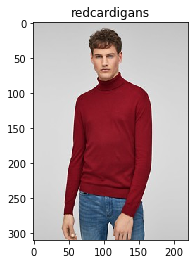

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redcardigans\image9_2020.12.03+20.41.37.jpeg


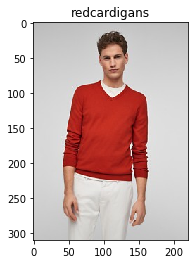

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\blackjackets\image2_2020.12.03+20.44.03.jpeg


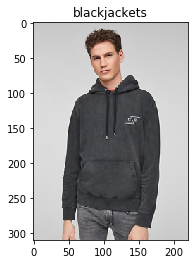

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\blackjackets\image8_2020.12.03+20.44.25.jpeg


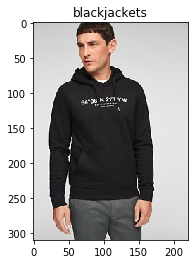

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\redshirts\image2_2020.12.03+20.46.50.jpeg


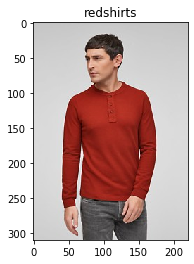

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\ZalandoImages\redshirts\image7_2020.12.03+20.51.05.jpeg


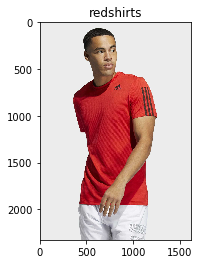


-------------------


-------------------


-------------------


-------------------


-------------------

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\pinkdresses\image4_2020.12.03+20.42.28.jpeg


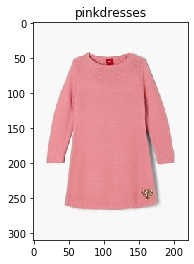

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\pinkdresses\image5_2020.12.03+20.42.32.jpeg


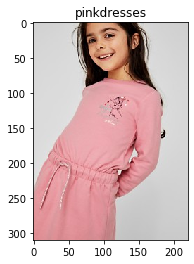

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\pinkdresses\image6_2020.12.03+20.42.35.jpeg


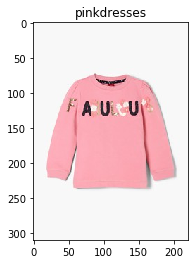

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\pinkdresses\image7_2020.12.03+20.42.39.jpeg


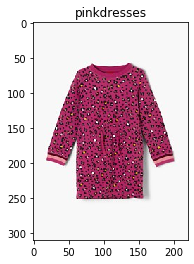

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\pinkdresses\image8_2020.12.03+20.42.42.jpeg


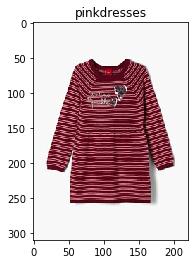

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\pinkdresses\image9_2020.12.03+20.42.46.jpeg


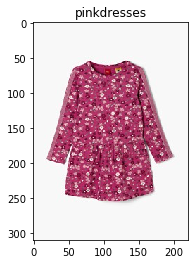

D:\Documents(D)\Projects\GitHub-repos\ISSEL\Science4Fashion_ref\WebCrawlers\SoliverImages\pinkdresses\image10_2020.12.03+20.42.50.jpeg


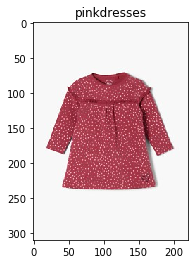


-------------------


-------------------


-------------------


-------------------


-------------------



In [14]:
query = '''SELECT * FROM "%s".public."Product"''' % dbName
productDF = pd.read_sql_query(query, engine)

for k in productDF['Cluster'].unique():
    sample = productDF.loc[productDF['Cluster']==k]
    for i,imgPath in sample['Photo'].items():
        print(imgPath)
        imgStream = open(imgPath, "rb")
        imgArray = np.asarray(bytearray(imgStream.read()), dtype=np.uint8)
        image = cv2.imdecode(imgArray, cv2.IMREAD_UNCHANGED)
        cv_imshow(image, sample.loc[i, 'Description'])
    print('\n-------------------\n')
    print('\n-------------------\n')
    print('\n-------------------\n')
    print('\n-------------------\n')
    print('\n-------------------\n')

In [ ]:
clustering_dict

In [ ]:
dataDF = pd.DataFrame({'Oid': productDF['Oid'], 'Cluster': clusters})
dataDF['Cluster'].count()

In [ ]:
productDF.columns

In [ ]:
clusteringDF

In [ ]:
ATTRIBUTESSOCIALMEDIA = ['CurrentPrice', 'ProductCategoryID', 'ProductSubcategoryID', 'GenderID', 'LengthID', 'SleeveID', 'CollarDesignID', 'NeckDesignID', 'FitID']
len(ATTRIBUTESSOCIALMEDIA)

In [ ]:
centerNew

In [ ]:
center

In [ ]:
None